In [1]:
import scanpy as sc
import pandas
import numpy

sc.settings.set_figure_params(dpi=100, facecolor='white')
import matplotlib.pyplot as plt

params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize':'xx-large'}

In [234]:
metadata = pandas.read_csv("metadata.csv")[["clone","sample","timepoint","series","condition","material","tenx","barcode","label"]]

In [235]:
metadata.index = metadata["barcode"]
metadata.head()

,clone,sample,timepoint,series,condition,material,tenx,barcode,label
barcode,,,,,,,,,
AAACCCACAACCGTGC-1,I,SA906_p15b,X15,SA906b-X15,U15,cell_line,SA906_p15b,AAACCCACAACCGTGC-1,X15
AAACCCACACCAACAT-1,I,SA906_p15b,X15,SA906b-X15,U15,cell_line,SA906_p15b,AAACCCACACCAACAT-1,X15
AAACCCACAGAAACCG-1,I,SA906_p15b,X15,SA906b-X15,U15,cell_line,SA906_p15b,AAACCCACAGAAACCG-1,X15
AAACGCTGTCTCACAA-1,I,SA906_p15b,X15,SA906b-X15,U15,cell_line,SA906_p15b,AAACGCTGTCTCACAA-1,X15
AAAGAACCATACGCAT-1,I,SA906_p15b,X15,SA906b-X15,U15,cell_line,SA906_p15b,AAAGAACCATACGCAT-1,X15


In [229]:
adata = sc.read_10x_mtx("./result")

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [236]:
unique_barcodes = []
for sample, barcode in zip(metadata["sample"],metadata["barcode"]):
    unique_barcodes.append(sample + "_" + barcode)

In [237]:
len(set(unique_barcodes))

46147

In [238]:
metadata.index = unique_barcodes
adata.obs = metadata

In [239]:
adata

AnnData object with n_obs × n_vars = 46147 × 33538
    obs: 'clone', 'sample', 'timepoint', 'series', 'condition', 'material', 'tenx', 'barcode', 'label'
    var: 'gene_ids', 'feature_types'

In [240]:
series = []
for sample in metadata["sample"]:
    if "SA609" in sample:
        series.append("SA609")
    elif "SA535" in sample:
        series.append("SA535")
    elif "SA1035" in sample:
        series.append("SA1035")
    elif "SA906a" in sample:
        series.append("SA906a")
    elif "SA906" in sample:
        if sample.endswith("b"):
            series.append("SA906b")
        elif sample.endswith("a"):
            series.append("SA906a")
    else:
        raise ValueError(sample)

In [241]:
adata.obs["series_name"] = series

In [242]:
color_df = pandas.read_csv("all_clones_new_colors.csv")
color_df.head()

,clone_id,cache_path,index,datatag,family,ref_datatag,uid,colour
0,A,/Users/sohrabsalehi/projects/fitness_material/...,1,SA535_CISPLATIN_CombinedU,SA535_CISPLATIN_Combined,SA535_CISPLATINU,A_SA535_CISPLATIN_Combined,#521913FF
1,B,/Users/sohrabsalehi/projects/fitness_material/...,2,SA535_CISPLATIN_CombinedU,SA535_CISPLATIN_Combined,SA535_CISPLATINU,B_SA535_CISPLATIN_Combined,#B997C6FF
2,D,/Users/sohrabsalehi/projects/fitness_material/...,3,SA535_CISPLATIN_CombinedU,SA535_CISPLATIN_Combined,SA535_CISPLATINU,D_SA535_CISPLATIN_Combined,#4E79C4FF
3,E,/Users/sohrabsalehi/projects/fitness_material/...,4,SA535_CISPLATIN_CombinedU,SA535_CISPLATIN_Combined,SA535_CISPLATINU,E_SA535_CISPLATIN_Combined,#D0B440FF
4,F,/Users/sohrabsalehi/projects/fitness_material/...,5,SA535_CISPLATIN_CombinedU,SA535_CISPLATIN_Combined,SA535_CISPLATINU,F_SA535_CISPLATIN_Combined,#7EB875FF


In [243]:
family = [x.split("_")[0] for x in color_df["family"]]
color_df["family"] = family
set(color_df["family"])

{'SA039U', 'SA1035', 'SA532', 'SA535', 'SA609', 'Sa906a', 'Sa906b'}

In [244]:
color_df

,clone_id,cache_path,index,datatag,family,ref_datatag,uid,colour
0,A,/Users/sohrabsalehi/projects/fitness_material/...,1,SA535_CISPLATIN_CombinedU,SA535,SA535_CISPLATINU,A_SA535_CISPLATIN_Combined,#521913FF
1,B,/Users/sohrabsalehi/projects/fitness_material/...,2,SA535_CISPLATIN_CombinedU,SA535,SA535_CISPLATINU,B_SA535_CISPLATIN_Combined,#B997C6FF
2,D,/Users/sohrabsalehi/projects/fitness_material/...,3,SA535_CISPLATIN_CombinedU,SA535,SA535_CISPLATINU,D_SA535_CISPLATIN_Combined,#4E79C4FF
3,E,/Users/sohrabsalehi/projects/fitness_material/...,4,SA535_CISPLATIN_CombinedU,SA535,SA535_CISPLATINU,E_SA535_CISPLATIN_Combined,#D0B440FF
4,F,/Users/sohrabsalehi/projects/fitness_material/...,5,SA535_CISPLATIN_CombinedU,SA535,SA535_CISPLATINU,F_SA535_CISPLATIN_Combined,#7EB875FF
...,...,...,...,...,...,...,...,...
103,I,/Users/sohrabsalehi/Desktop/SC-1311/plots/sep_...,9,SA906b,Sa906b,SA906b,I_Sa906b,#B38BC0FF
104,A,/Users/sohrabsalehi/Desktop/SC-1311/plots/sep_...,1,SA532,SA532,SA532,A_SA532,#E7EBFAFF
105,B,/Users/sohrabsalehi/Desktop/SC-1311/plots/sep_...,2,SA532,SA532,SA532,B_SA532,#4E79C4FF
106,C,/Users/sohrabsalehi/Desktop/SC-1311/plots/sep_...,3,SA532,SA532,SA532,C_SA532,#D0B440FF


Trying to set attribute `.obs` of view, copying.


... storing 'clone' as categorical
... storing 'sample' as categorical
... storing 'timepoint' as categorical
... storing 'series' as categorical
... storing 'condition' as categorical
... storing 'material' as categorical
... storing 'tenx' as categorical
... storing 'barcode' as categorical
... storing 'label' as categorical
... storing 'series_name' as categorical
... storing 'batch_info' as categorical
... storing 'phase' as categorical
... storing 'feature_types' as categorical
2021-01-26 16:10:04,630 - harmonypy - INFO - Iteration 1 of 50
2021-01-26 16:10:05,731 - harmonypy - INFO - Iteration 2 of 50
2021-01-26 16:10:06,769 - harmonypy - INFO - Converged after 2 iterations


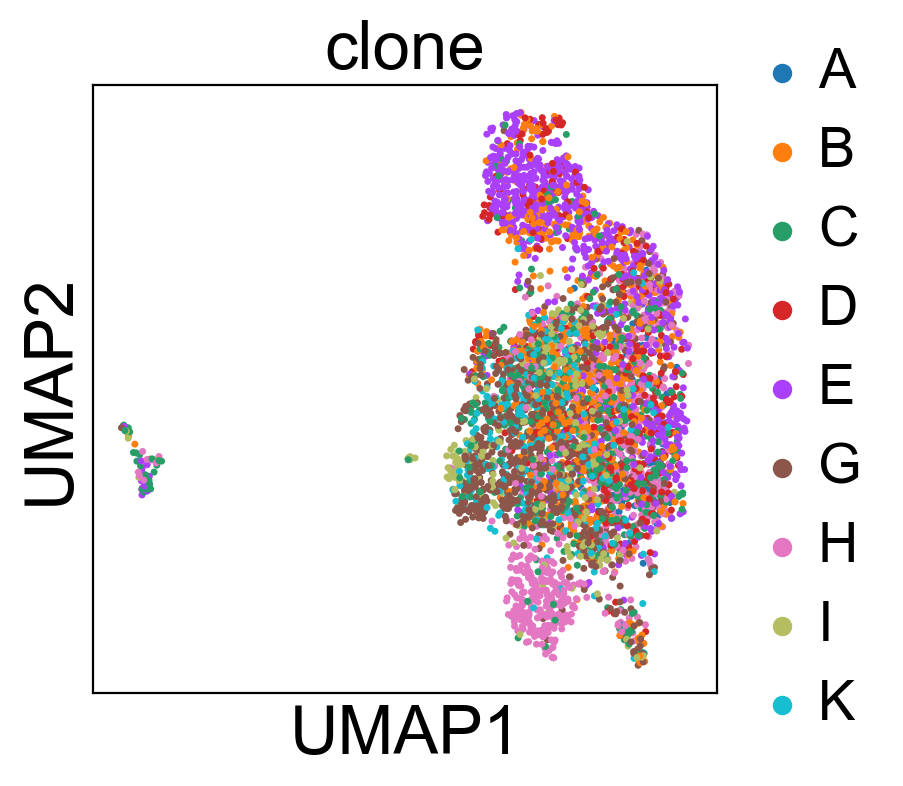

In [343]:
sa1035 = adata[adata.obs["series_name"] == 'SA1035']
sa1035 = sa1035[sa1035.obs["clone"] != "None"]
sa1035 = sa1035[sa1035.obs["clone"] != "unassigned"]
colors = color_df[color_df["family"]=="SA1035"]
color_map = dict(zip(colors["clone_id"],colors["colour"]))
sa1035 = sa1035[sa1035.obs["clone"].isin(color_map.keys())]
color_map = dict(zip(colors["clone_id"],colors["colour"]))

batch_sa1035 = pandas.read_csv("tmp/batch_infos/metasample_SA1035.csv")
batch_sa1035
batch_info = dict(zip(batch_sa1035["mouse_id"].tolist(), [x.split("_")[2] for x in batch_sa1035["library_id"].tolist()]))
batch_labels = [batch_info[x] for x in sa1035.obs["tenx"].tolist()]
sa1035.obs["batch_info"] = batch_labels

cell_cycle_genes = [x.strip() for x in open("regev_lab_cell_cycle_genes.txt","r").read().splitlines()]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
sa1035.var['mt'] = adata.var_names.str.startswith('MT-')
sc.tl.score_genes_cell_cycle(sa1035, s_genes=s_genes, g2m_genes=g2m_genes)
sc.pp.calculate_qc_metrics(sa1035, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.regress_out(sa1035, ['total_counts','pct_counts_mt','S_score','G2M_score'])
sc.pp.scale(adata)

sc.tl.pca(sa1035, svd_solver='arpack')
sc.external.pp.harmony_integrate(sa1035,key="batch_info",theta=0.1,lamb=4,max_iter_harmony=50,tau=600)
sc.pp.neighbors(sa1035, n_neighbors=10, n_pcs=50, use_rep="X_pca_harmony")
sc.tl.umap(sa1035)
sc.pl.umap(sa1035,color="clone", title="clone")

        

In [344]:
condition = []
for series in sa1035.obs["series"]:
    if "T" in series:
        condition.append("Treatment")
    else:
        condition.append("Untreated")
sa1035.obs["therapy"] = condition 
print(set(condition))

{'Treatment', 'Untreated'}


In [345]:
clone_colors = sa1035.uns["clone_colors"]
clones = set(sa1035.obs["clone"])
clone_colors = [color_map[clone] for clone in sorted(clones)]
sa1035.uns["clone_colors"] = numpy.array(clone_colors)

... storing 'therapy' as categorical


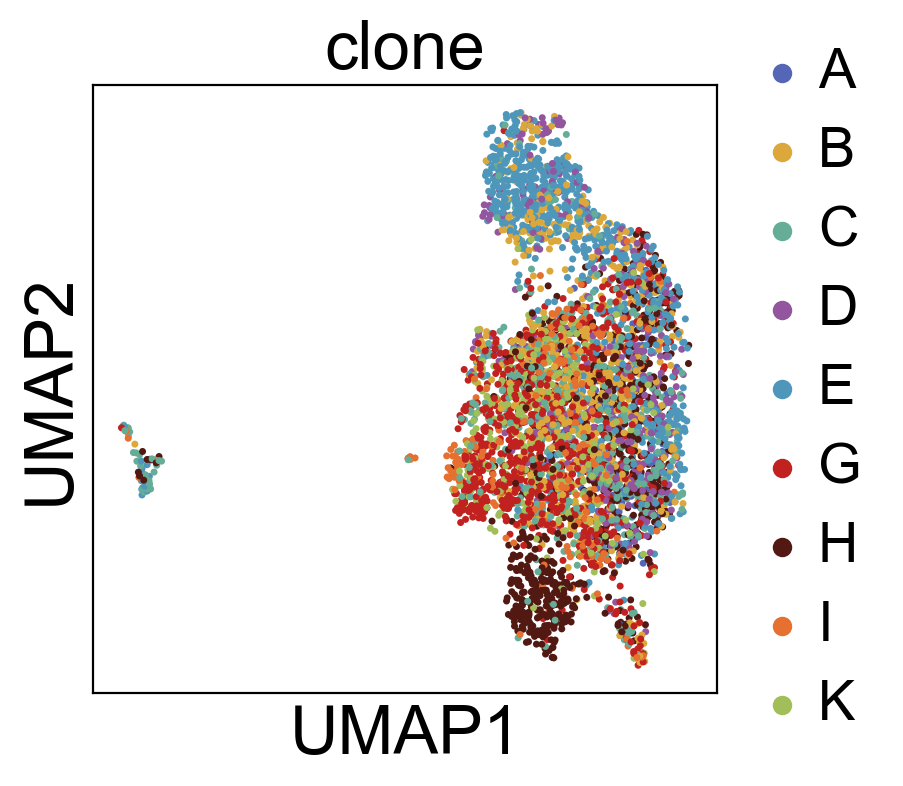

In [346]:
sc.pl.umap(sa1035,color="clone")

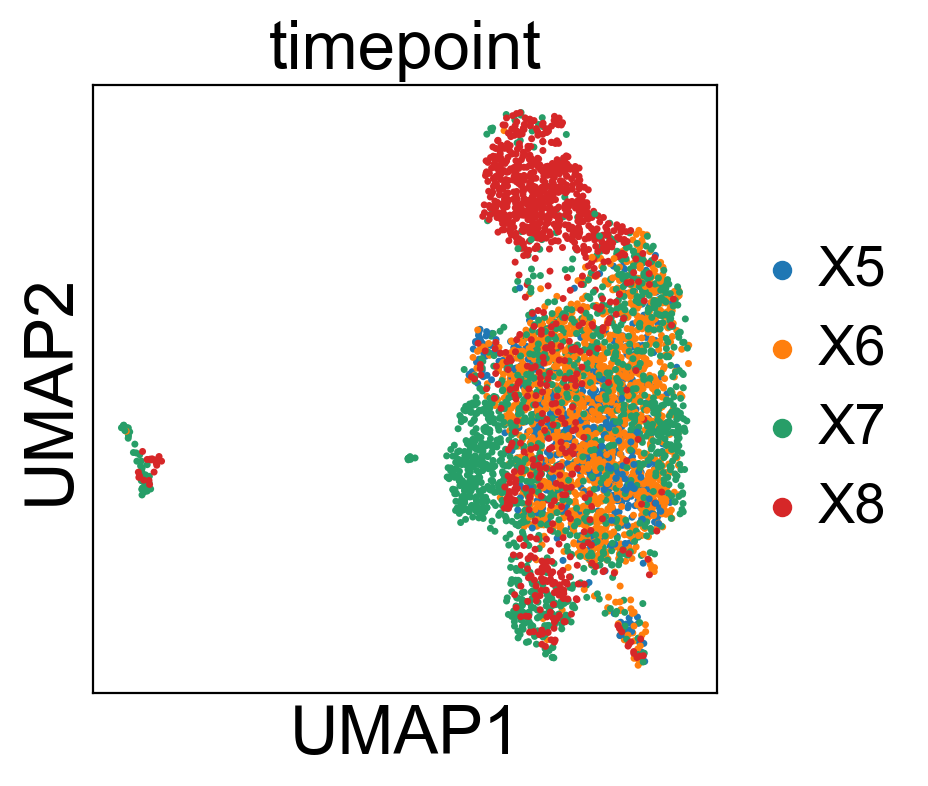

In [347]:
sc.pl.umap(sa1035,color="timepoint")

Text(0.5, 0, '')

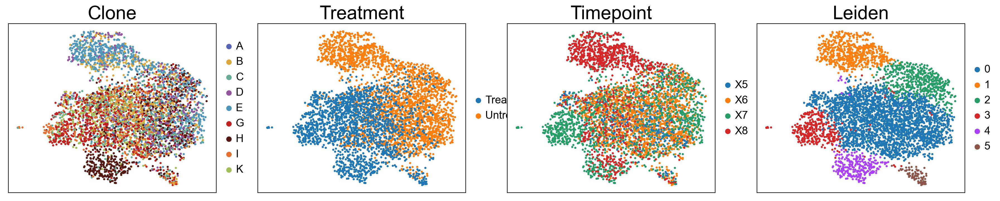

In [367]:
# sc.pl.umap(sa1035,color="therapy", title="Therapy")
# set(sa1035.obs["timepoint"])
# sc.tl.leiden(sa1035, resolution=0.34)
# set(sa1035.obs["leiden"])
# sa1035 = sa1035[sa1035.obs["leiden"]!= "6"]
# sc.pl.umap(sa1035,color="leiden", title="clust")
params = {'legend.fontsize': 'medium',
          'axes.labelsize': 'large',
          'axes.titlesize':'xx-large'}
plt.rcParams.update(params)
plt.figure(figsize = (22, 4))
ax = plt.subplot(1,4,1)
sc.pl.umap(sa1035, color="clone", title="Clone", ax=ax, show=False, size=30)
ax.set_ylabel('')
ax.set_xlabel('')
ax = plt.subplot(1,4,2)
sc.pl.umap(sa1035, color="therapy", title="Treatment", ax=ax, show=False, size=30)
ax.set_ylabel('')
ax.set_xlabel('')
ax = plt.subplot(1,4,3)
sc.pl.umap(sa1035, color="timepoint", title="Timepoint", ax=ax, show=False, size=30)
ax.set_ylabel('')
ax.set_xlabel('')
ax = plt.subplot(1,4,4)
sc.pl.umap(sa1035, color="leiden", title="Leiden", ax=ax, show=False, size=30)
ax.set_ylabel('')
ax.set_xlabel('')

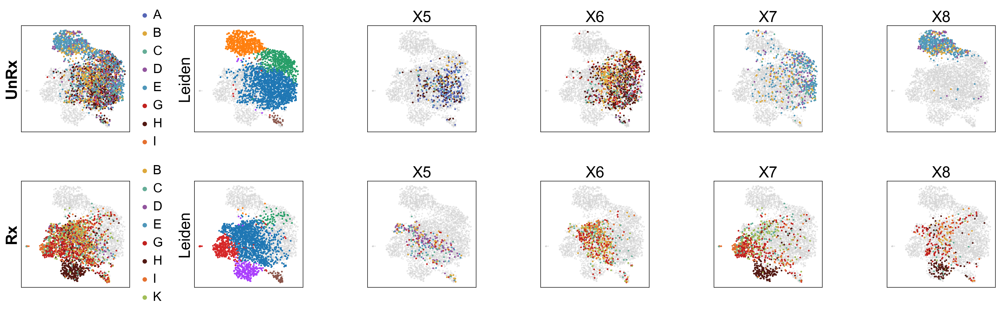

In [360]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize':'xx-large'}
plt.rcParams.update(params)



plt.figure(figsize = (22, 7))

i = 0
condition_subset = sa1035[sa1035.obs["therapy"] == "Untreated"]
ax = plt.subplot(2,6,i+1)
sc.pl.umap(sa1035, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="clone", title="", ax=ax, show=False, size=30)
ax.set_ylabel('UnRx',fontweight="bold")
ax.set_xlabel('')
i += 1


ax = plt.subplot(2,6,i+1)
sc.pl.umap(sa1035, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="leiden", title="", ax=ax, show=False, size=30)
ax.set_ylabel('Leiden')
ax.set_xlabel('')
ax.get_legend().remove()
i += 1


for timepoint in sorted(set(sa1035.obs["timepoint"])):
    if timepoint == "X4": continue
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,6,i+1)
    sc.pl.umap(sa1035, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30)
    ax.get_legend().remove()
    if i > 0:
        ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1


condition_subset = sa1035[sa1035.obs["therapy"] == "Treatment"]
ax = plt.subplot(2,6,i+1)
sc.pl.umap(sa1035, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset,color="clone", title="", ax=ax, show=False, size=30)
ax.set_ylabel('Rx', fontweight="bold")
ax.set_xlabel('')
i += 1

ax = plt.subplot(2,6,i+1)
sc.pl.umap(sa1035, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="leiden", title="", ax=ax, show=False, size=30)
ax.set_ylabel('Leiden')
ax.set_xlabel('')
ax.get_legend().remove()


i += 1
for timepoint in sorted(set(sa1035.obs["timepoint"])):
    if timepoint == "X4": continue
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,6,i+1)
    sc.pl.umap(sa1035, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30)
    ax.get_legend().remove()
    if i != 5:
        ax.set_ylabel('')
    if i != 2:
        ax.set_xlabel('')
    i += 1

plt.tight_layout()
plt.savefig("SA1035.png")
plt.savefig("SA1035.svg")

<Figure size 400x400 with 0 Axes>

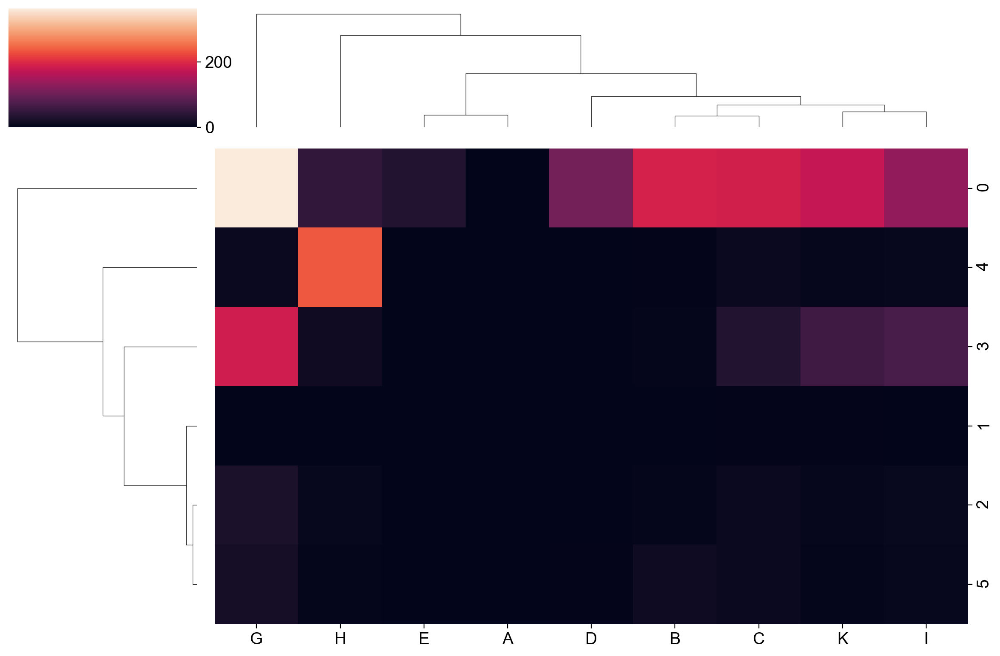

In [384]:
import seaborn as sns
resolution = 0.34
sc.tl.leiden(sa1035, resolution=resolution)
matrix = []
rows = list(set(sa1035.obs["leiden"]))
cols = list(set(sa1035.obs["clone"]))
therapy = "Treatment"
for cluster in rows:
    row = []
    for clone in cols:
        subset = sa1035[sa1035.obs["leiden"] == cluster]
        subset = subset[subset.obs["clone"] == clone]
        subset = subset[subset.obs["therapy"] == therapy]
        row.append(len(subset.obs))
    matrix.append(row)
matrix = numpy.array(matrix)
df = pandas.DataFrame(matrix,index=rows,columns=cols)
plt.figure()
sns.clustermap(df,figsize=(12,8))
plt.tight_layout()
plt.savefig("leiden_to_clone_res_{}.png".format(resolution))



In [161]:
sa535 = adata[adata.obs["series_name"] == 'SA535']
set(sa535.obs["clone"])
condition = []
for series in sa535.obs["series"]:
    if "T" in series:
        condition.append("Treatment")
    else:
        condition.append("Untreated")
sa535.obs["therapy"] = condition 
sa535 = sa535[sa535.obs["clone"] != "None"]
sa535 = sa535[sa535.obs["clone"] != "unassigned"]
colors = color_df[color_df["family"]=="SA535"]
color_map = dict(zip(colors["clone_id"],colors["colour"]))
color_map["B_C"] = "#9c6ab0ff".upper()
print(color_map.keys())
sa535 = sa535[sa535.obs["clone"].isin(color_map.keys())]
sa535

Trying to set attribute `.obs` of view, copying.


dict_keys(['A', 'B', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'C', 'B_C'])


View of AnnData object with n_obs × n_vars = 6370 × 33538
    obs: 'clone', 'sample', 'timepoint', 'series', 'condition', 'material', 'tenx', 'barcode', 'label', 'series_name', 'therapy'
    var: 'gene_ids', 'feature_types'

In [162]:
batch_sa535 = pandas.read_csv("tmp/batch_infos/metasample_SA535.csv")
batch_info = dict(zip(batch_sa535["library_id"].tolist(), batch_sa535["batch_info"].tolist()))
batch_labels = [batch_info[x] for x in sa535.obs["tenx"].tolist()]
sa535.obs["batch_info"] = batch_labels

Trying to set attribute `.obs` of view, copying.


In [385]:
cell_cycle_genes = [x.strip() for x in open("regev_lab_cell_cycle_genes.txt","r").read().splitlines()]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
sa535.var['mt'] = sa535.var_names.str.startswith('MT-')
sc.tl.score_genes_cell_cycle(sa535, s_genes=s_genes, g2m_genes=g2m_genes)
sc.pp.calculate_qc_metrics(sa535, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.regress_out(sa535, ['total_counts','pct_counts_mt','S_score','G2M_score'])
sc.pp.scale(sa535)

sc.tl.pca(sa535, svd_solver='arpack')
sc.external.pp.harmony_integrate(sa535,key="batch_info",theta=0.1,lamb=4,max_iter_harmony=50,tau=600)
sc.pp.neighbors(sa535, n_neighbors=10, n_pcs=50, use_rep="X_pca_harmony")
sc.tl.umap(sa535)

... storing 'phase' as categorical
2021-01-26 16:49:42,773 - harmonypy - INFO - Iteration 1 of 50
2021-01-26 16:49:44,641 - harmonypy - INFO - Iteration 2 of 50
2021-01-26 16:49:46,323 - harmonypy - INFO - Iteration 3 of 50
2021-01-26 16:49:48,015 - harmonypy - INFO - Iteration 4 of 50
2021-01-26 16:49:49,598 - harmonypy - INFO - Iteration 5 of 50
2021-01-26 16:49:50,744 - harmonypy - INFO - Iteration 6 of 50
2021-01-26 16:49:51,837 - harmonypy - INFO - Iteration 7 of 50
2021-01-26 16:49:52,831 - harmonypy - INFO - Iteration 8 of 50
2021-01-26 16:49:53,848 - harmonypy - INFO - Iteration 9 of 50
2021-01-26 16:49:54,803 - harmonypy - INFO - Iteration 10 of 50
2021-01-26 16:49:55,864 - harmonypy - INFO - Iteration 11 of 50
2021-01-26 16:49:56,771 - harmonypy - INFO - Iteration 12 of 50
2021-01-26 16:49:57,804 - harmonypy - INFO - Converged after 12 iterations


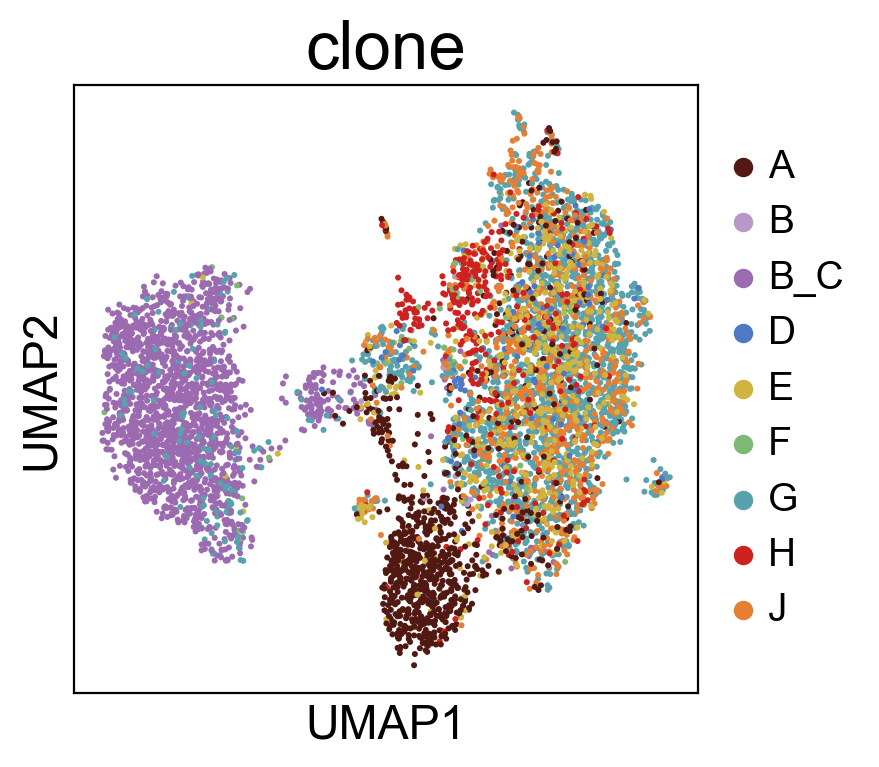

In [386]:
sc.pl.umap(sa535,color="clone")

In [388]:
color_map = dict(zip(colors["clone_id"],colors["colour"]))
color_map["B_C"] = "#9c6ab0ff".upper()
print(color_map.keys())
clone_colors = sa535.uns["clone_colors"]
clones = set(sa535.obs["clone"])
clone_colors = [color_map[clone] for clone in sorted(clones)]
sa535.uns["clone_colors"] = numpy.array(clone_colors)

dict_keys(['B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'A', 'B_C'])


{'X9', 'X7', 'X6', 'X8', 'X10'}


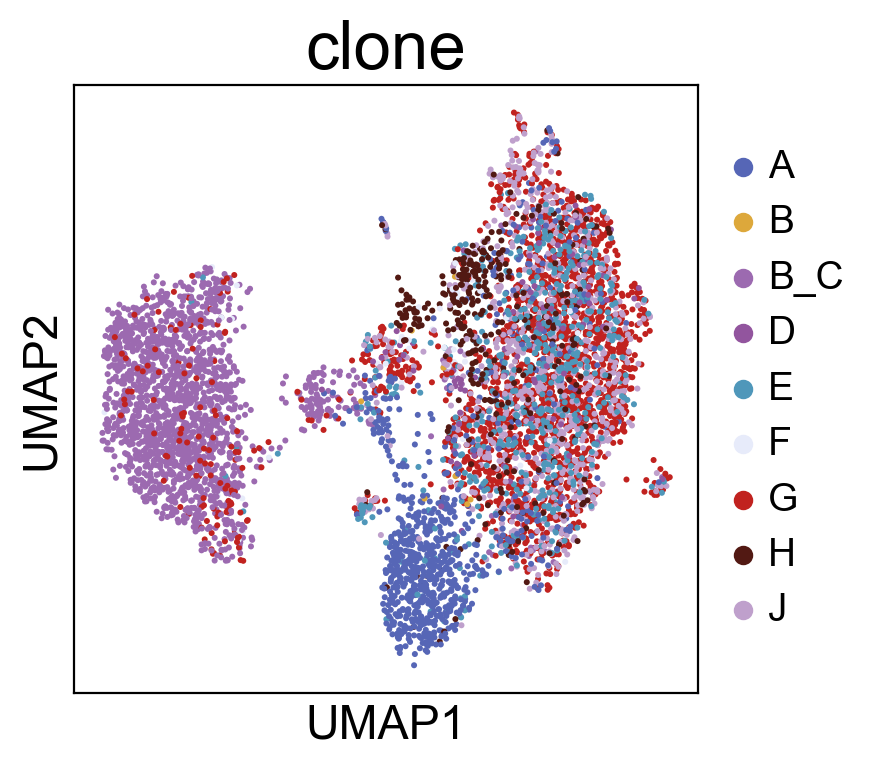

In [389]:
print(set(sa535.obs["timepoint"]))
sc.pl.umap(sa535,color="clone")

In [390]:
tps_sorted = list(set(sa535.obs["timepoint"]))
print(tps_sorted)
tps_rx = [tps_sorted[1],tps_sorted[-2],tps_sorted[0],tps_sorted[-1]]
tps_urx = [tps_sorted[2],tps_sorted[1],tps_sorted[-2],tps_sorted[0]]
print(tps_rx)
print(tps_urx)
print(set(sa535.obs["therapy"]))

['X9', 'X7', 'X6', 'X8', 'X10']
['X7', 'X8', 'X9', 'X10']
['X6', 'X7', 'X8', 'X9']
{'Treatment', 'Untreated'}


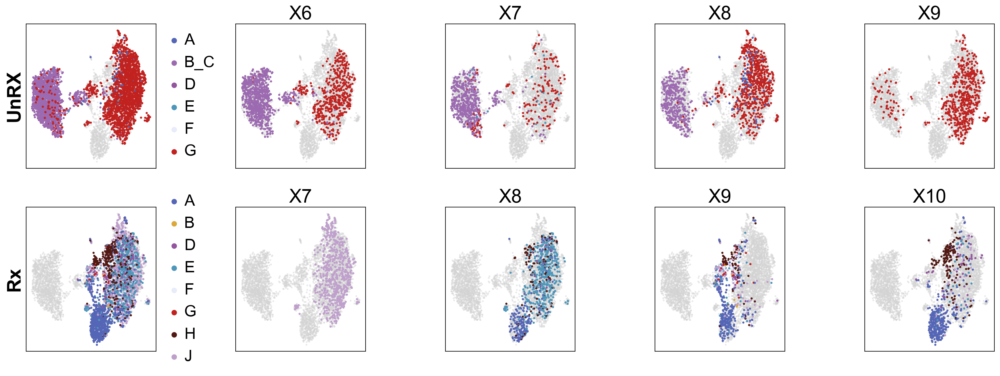

In [391]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize':'xx-large'}
plt.rcParams.update(params)

plt.figure(figsize = (18, 7))
i = 0
condition_subset = sa535[sa535.obs["therapy"] == "Untreated"]
ax = plt.subplot(2,5,i+1)
sc.pl.umap(sa535, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="clone", title="", ax=ax, show=False, size=30)
ax.set_ylabel('UnRX',fontweight="bold")
ax.set_xlabel('')
i += 1

for timepoint in tps_urx:
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,5,i+1)
    sc.pl.umap(sa535, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30)
    ax.get_legend().remove()
    ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1


condition_subset = sa535[sa535.obs["therapy"] == "Treatment"]

ax = plt.subplot(2,5,i+1)
sc.pl.umap(sa535, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset,color="clone", title="", ax=ax, show=False, size=30)
ax.set_ylabel('Rx',fontweight="bold")
ax.set_xlabel('')
i += 1

for timepoint in tps_rx:
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,5,i+1)
    sc.pl.umap(sa535, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30)
    ax.get_legend().remove()
    ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1

    
plt.tight_layout()
plt.savefig("SA535.png")
plt.savefig("SA535.svg")

In [253]:
sa609 = adata[adata.obs["series_name"] == 'SA609']
condition = []
for series in sa609.obs["series"]:
    if "T" in series:
        condition.append("Treatment")
    else:
        condition.append("Untreated")
sa609.obs["therapy"] = condition 
sa609 = sa609[sa609.obs["clone"] != "None"]
sa609 = sa609[sa609.obs["clone"] != "unassigned"]
colors = color_df[color_df["family"]=="SA609"]
color_map = dict(zip(colors["clone_id"],colors["colour"]))
sa609 = sa609[sa609.obs["clone"].isin(color_map.keys())]
sa609
batch_sa609 = pandas.read_csv("tmp/batch_infos/SA609_10x.csv")
batch_sa609
batch_info = dict(zip(batch_sa609["mouse_id"].tolist(), batch_sa609["batch_info"].tolist()))
batch_labels = [batch_info[x] for x in sa609.obs["tenx"].tolist()]
sa609.obs["batch_info"] = batch_labels
sa609

sc.pp.recipe_zheng17(sa609)
sc.tl.pca(sa609, svd_solver='arpack')
sc.external.pp.harmony_integrate(sa609,key="batch_info",theta=0.15,lamb=4,max_iter_harmony=50)
sc.pp.neighbors(sa609, n_neighbors=10, n_pcs=50, use_rep="X_pca_harmony")
sc.tl.umap(sa609)

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
2021-01-25 23:07:43,886 - harmonypy - INFO - Iteration 1 of 50
2021-01-25 23:07:48,351 - harmonypy - INFO - Iteration 2 of 50
2021-01-25 23:07:52,831 - harmonypy - INFO - Converged after 2 iterations


... storing 'clone' as categorical
... storing 'sample' as categorical
... storing 'timepoint' as categorical
... storing 'series' as categorical
... storing 'condition' as categorical
... storing 'material' as categorical
... storing 'tenx' as categorical
... storing 'barcode' as categorical
... storing 'label' as categorical
... storing 'series_name' as categorical
... storing 'therapy' as categorical
... storing 'batch_info' as categorical
... storing 'feature_types' as categorical


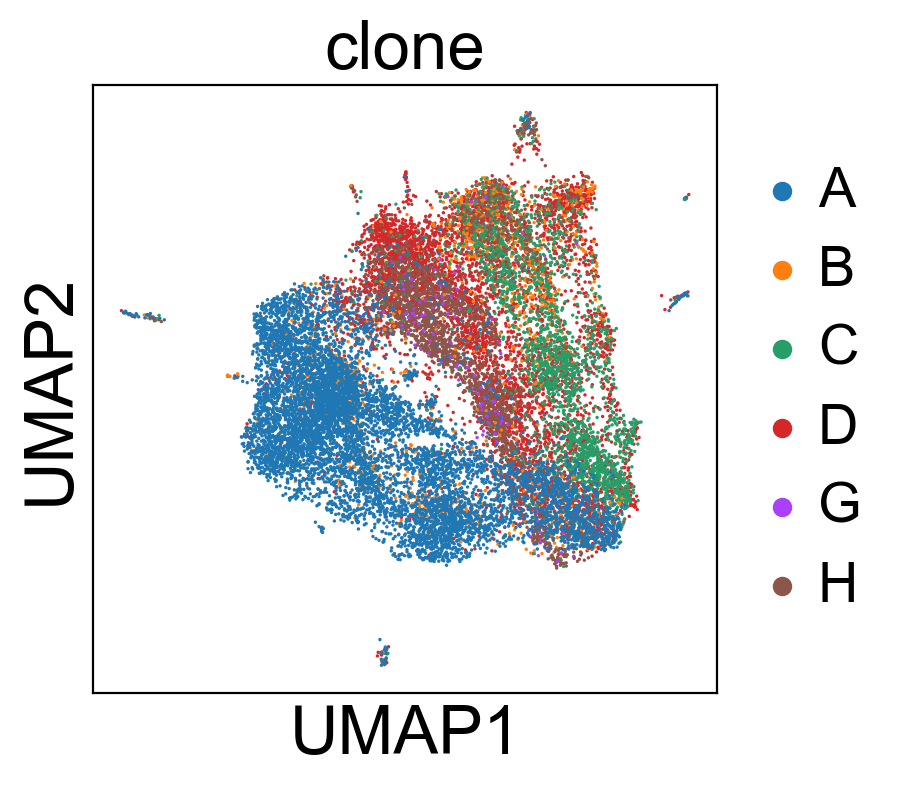

In [254]:
sc.pl.umap(sa609,color="clone")

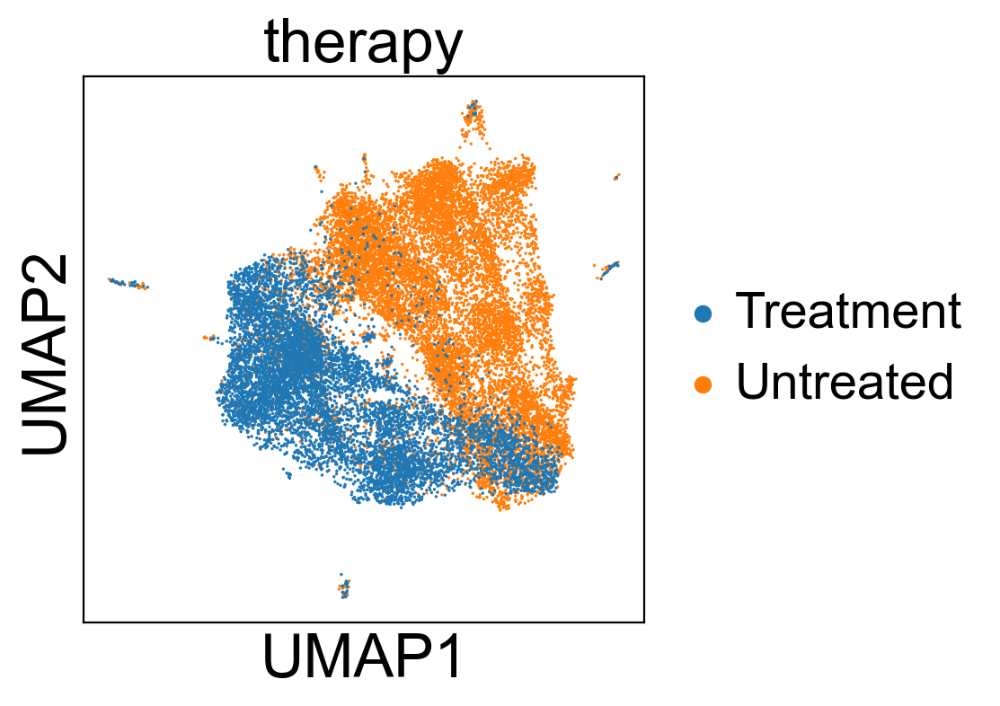

In [255]:
sc.pl.umap(sa609,color="therapy")

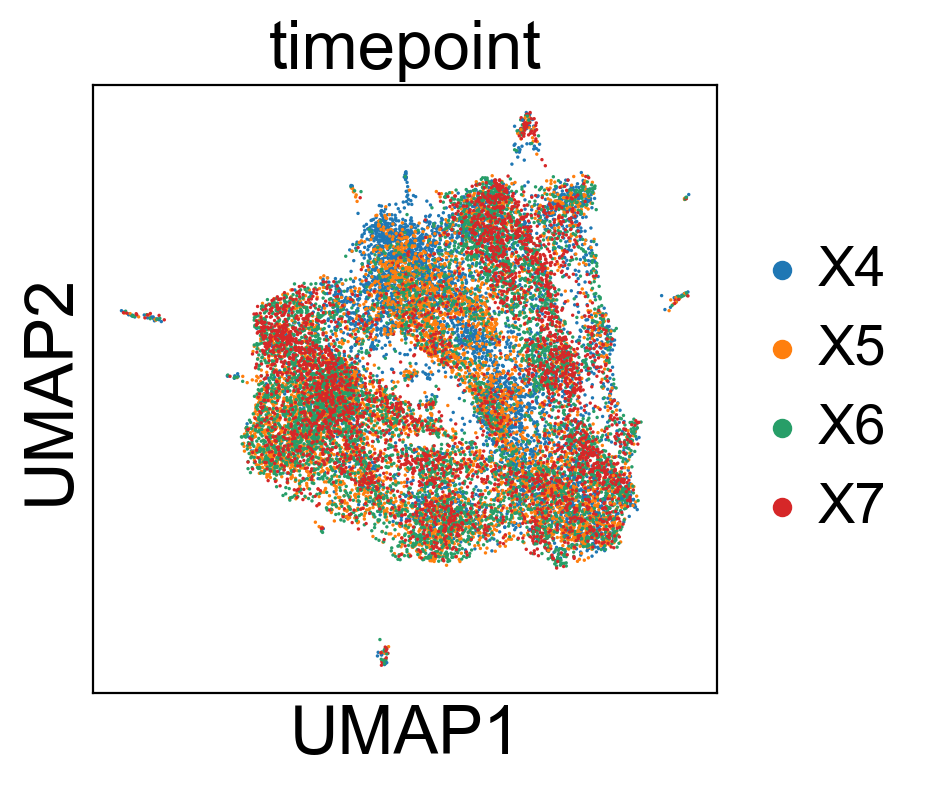

In [256]:
sc.pl.umap(sa609,color="timepoint")

In [257]:
clone_colors = sa609.uns["clone_colors"]
clones = set(sa609.obs["clone"])
clone_colors = [color_map[clone] for clone in sorted(clones)]
sa609.uns["clone_colors"] = numpy.array(clone_colors)

In [258]:
set(sa609.obs["timepoint"])

{'X4', 'X5', 'X6', 'X7'}

0


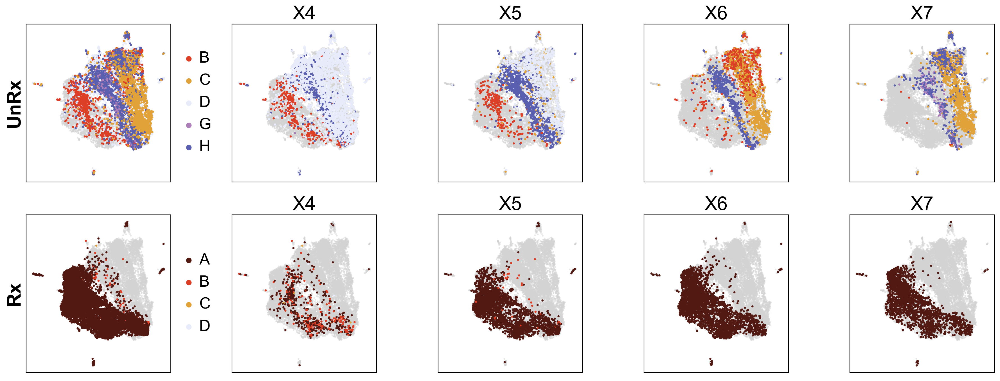

In [259]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize':'xx-large'}
plt.rcParams.update(params)

plt.figure(figsize = (18, 7))
# plt.figure(figsize = (24, 8))
i = 0
condition_subset = sa609[sa609.obs["therapy"] == "Untreated"]
print(i)
ax = plt.subplot(2,5,i+1)
sc.pl.umap(sa609, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="clone", title="", ax=ax, show=False, size=30)
ax.set_ylabel('UnRx',fontweight="bold")
ax.set_xlabel('')
i += 1

for timepoint in sorted(set(sa609.obs["timepoint"])):
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,5,i+1)
    sc.pl.umap(sa609, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30)
    ax.get_legend().remove()
    if i > 0:
        ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1


condition_subset = sa609[sa609.obs["therapy"] == "Treatment"]

ax = plt.subplot(2,5,i+1)
sc.pl.umap(sa609, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset,color="clone", title="", ax=ax, show=False, size=30)
ax.set_xlabel('')
ax.set_ylabel('Rx', fontweight="bold")

i += 1
for timepoint in sorted(set(sa609.obs["timepoint"])):
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,5,i+1)
    sc.pl.umap(sa609, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30)
    ax.get_legend().remove()
    ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1
    
plt.tight_layout()
plt.savefig("SA609.png")
plt.savefig("SA609.svg")

In [213]:
sa906a = adata[adata.obs["series_name"] == 'SA906a']
condition = []
for series in sa906a.obs["series"]:
    if "T" in series:
        condition.append("Treatment")
    else:
        condition.append("Untreated")
sa906a.obs["therapy"] = condition 
sa906a = sa906a[sa906a.obs["clone"] != "None"]
sa906a = sa906a[sa906a.obs["clone"] != "unassigned"]
colors = color_df[color_df["family"]=="Sa906a"]
color_map = dict(zip(colors["clone_id"],colors["colour"]))
print(color_map)
sa906a = sa906a[sa906a.obs["clone"].isin(color_map.keys())]

sc.tl.pca(sa906a, svd_solver='arpack')
sc.pp.neighbors(sa906a, n_neighbors=10, n_pcs=50)
sc.tl.umap(sa906a)

Trying to set attribute `.obs` of view, copying.


{'A': '#521913FF', 'B': '#65AD97FF', 'C': '#A1BE58FF', 'D': '#4F97BAFF', 'E': '#5666B6FF', 'F': '#DDA83BFF', 'G': '#C1221FFF', 'H': '#BFA0CCFF', 'I': '#E7EBFAFF', 'J': '#E5702FFF', 'K': '#92559EFF'}


... storing 'clone' as categorical
... storing 'sample' as categorical
... storing 'timepoint' as categorical
... storing 'series' as categorical
... storing 'condition' as categorical
... storing 'material' as categorical
... storing 'tenx' as categorical
... storing 'barcode' as categorical
... storing 'label' as categorical
... storing 'series_name' as categorical
... storing 'therapy' as categorical
... storing 'feature_types' as categorical


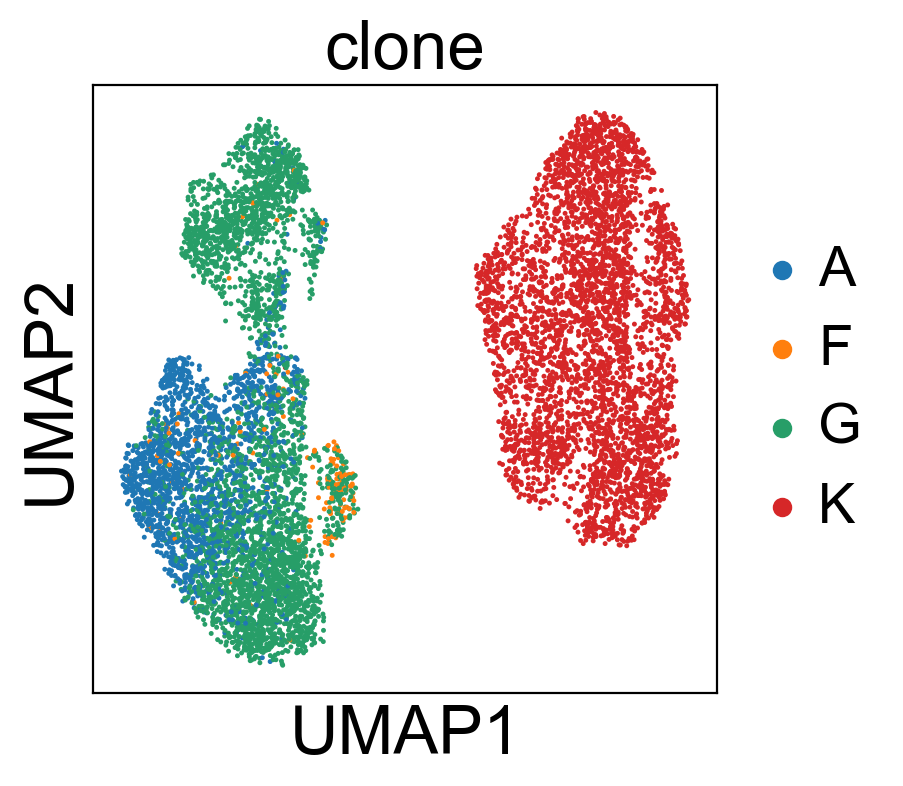

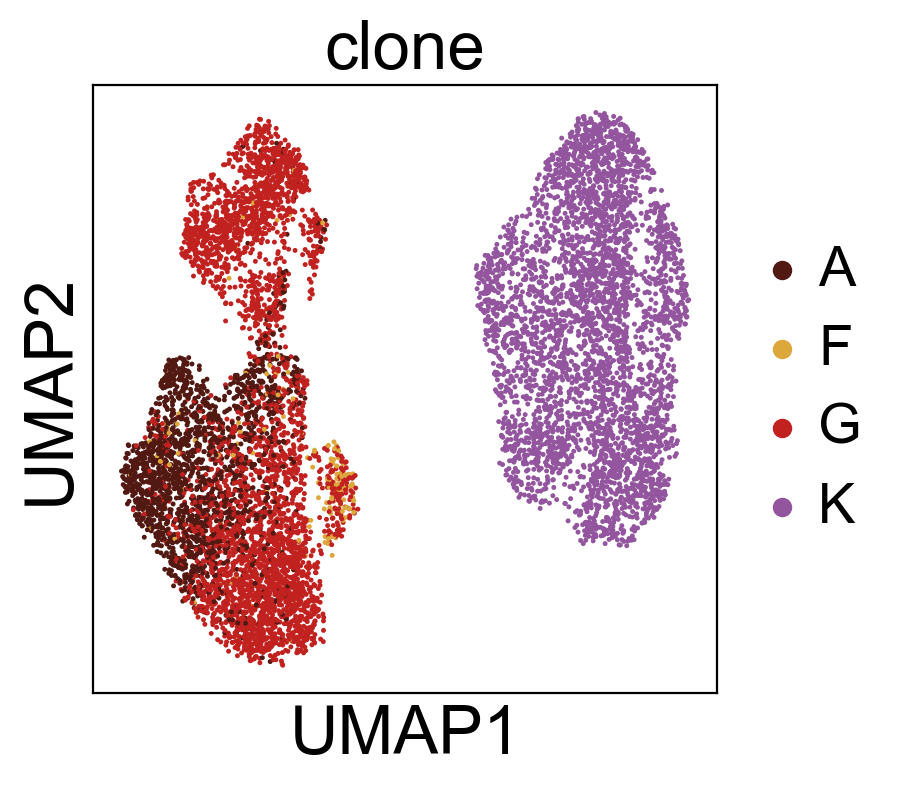

In [214]:
sc.pl.umap(sa906a,color="clone")
clone_colors = sa906a.uns["clone_colors"]
clones = set(sa906a.obs["clone"])
clone_colors = [color_map[clone] for clone in sorted(clones)]
sa906a.uns["clone_colors"] = numpy.array(clone_colors)
sc.pl.umap(sa906a,color="clone")

In [215]:
set(sa906a.obs["timepoint"])

{'X11', 'X57'}

0


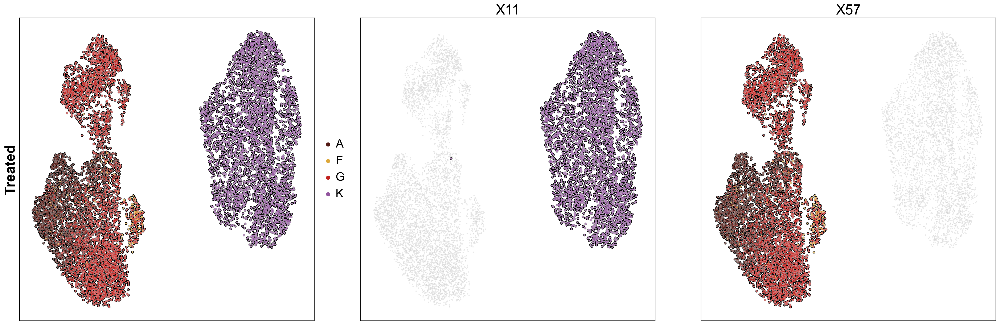

In [216]:
plt.figure(figsize = (24, 8))
i = 0
condition_subset = sa906a[sa906a.obs["therapy"] == "Untreated"]
print(i)
ax = plt.subplot(1,3,i+1)
sc.pl.umap(sa906a, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="clone", title="", ax=ax, show=False, size=30, add_outline=True)
ax.set_ylabel('Treated',fontweight="bold")
ax.set_xlabel('')
i += 1

for timepoint in sorted(set(sa906a.obs["timepoint"])):
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(1,3,i+1)
    sc.pl.umap(sa906a, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30, add_outline=True)
    ax.get_legend().remove()
    if i > 0:
        ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1

    
plt.tight_layout()
plt.savefig("SA906a.png")

In [217]:
sa906b = adata[adata.obs["series_name"] == 'SA906b']
condition = []
for series in sa906b.obs["series"]:
    if "T" in series:
        condition.append("Treatment")
    else:
        condition.append("Untreated")
sa906b.obs["therapy"] = condition 
sa906b = sa906b[sa906b.obs["clone"] != "None"]
sa906b = sa906b[sa906b.obs["clone"] != "unassigned"]
colors = color_df[color_df["family"]=="Sa906b"]
color_map = dict(zip(colors["clone_id"],colors["colour"]))
sa906b = sa906b[sa906b.obs["clone"].isin(color_map.keys())]
print(color_map)
sc.tl.pca(sa906b, svd_solver='arpack')
sc.pp.neighbors(sa906b, n_neighbors=10, n_pcs=50)
sc.tl.umap(sa906b)

Trying to set attribute `.obs` of view, copying.


{'A': '#B5BD4CFF', 'B': '#E59036FF', 'C': '#6C4F9EFF', 'D': '#DA2822FF', 'E': '#521913FF', 'F': '#65AD97FF', 'G': '#E7EBFAFF', 'H': '#4E8EC2FF', 'I': '#B38BC0FF'}


... storing 'clone' as categorical
... storing 'sample' as categorical
... storing 'timepoint' as categorical
... storing 'series' as categorical
... storing 'condition' as categorical
... storing 'material' as categorical
... storing 'tenx' as categorical
... storing 'barcode' as categorical
... storing 'label' as categorical
... storing 'series_name' as categorical
... storing 'therapy' as categorical
... storing 'feature_types' as categorical


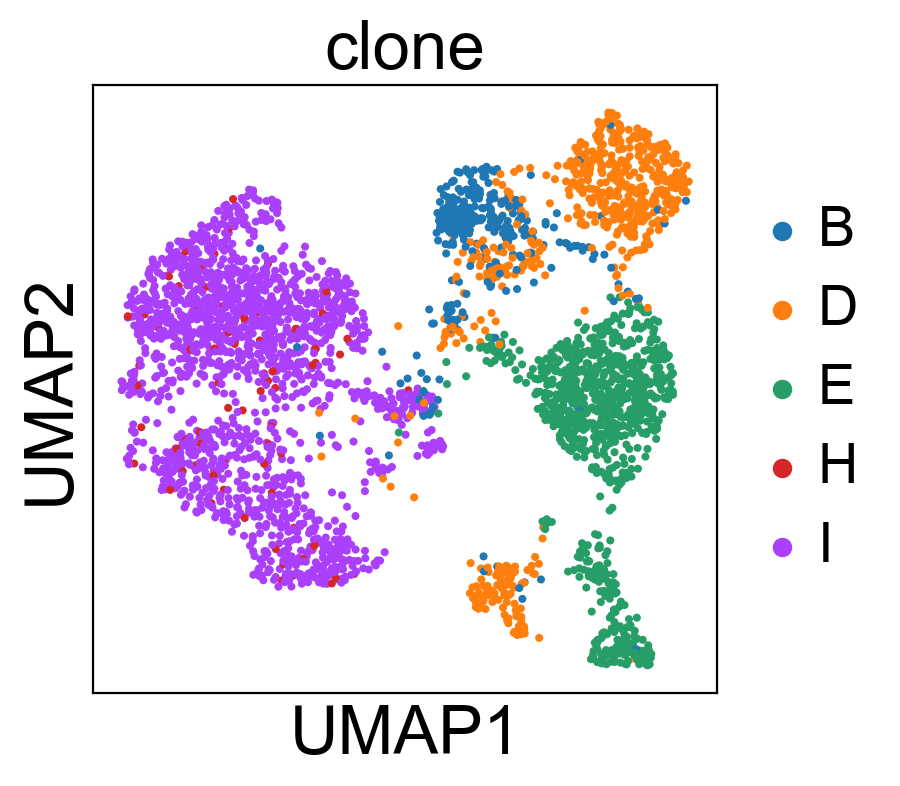

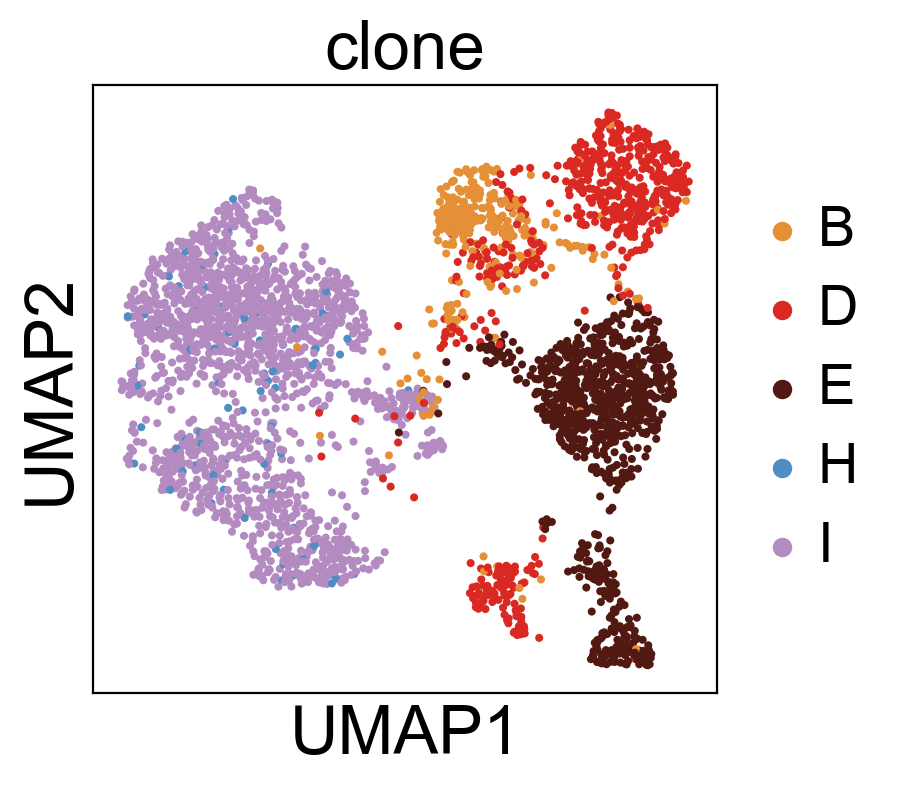

{'X50', 'X15'}


In [218]:
sc.pl.umap(sa906b,color="clone")
clone_colors = sa906b.uns["clone_colors"]
clones = set(sa906b.obs["clone"])
clone_colors = [color_map[clone][:-2] for clone in sorted(clones)]
sa906b.uns["clone_colors"] = numpy.array(clone_colors)
sc.pl.umap(sa906b,color="clone")
print(set(sa906b.obs["timepoint"]))

0
X15
X50


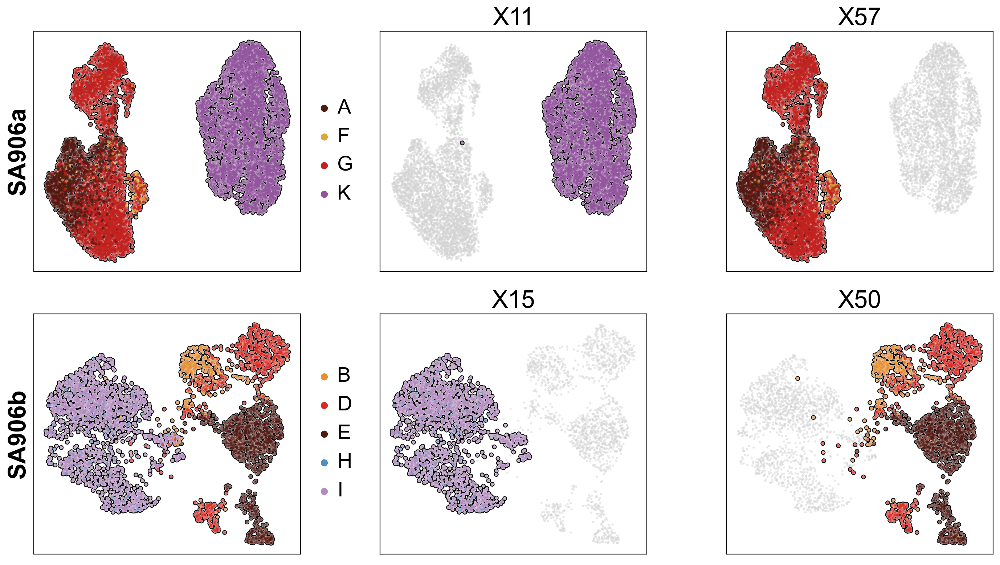

In [219]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize':'xx-large'}
plt.rcParams.update(params)
plt.figure(figsize = (14, 8))
i = 0
condition_subset = sa906a[sa906a.obs["therapy"] == "Untreated"]
print(i)
ax = plt.subplot(2,3,i+1)
sc.pl.umap(sa906a, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset, color="clone", title="", ax=ax, show=False, size=30, add_outline=True)
ax.set_ylabel('SA906a',fontweight="bold")
ax.set_xlabel('')
i += 1

for timepoint in sorted(set(sa906a.obs["timepoint"])):
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,3,i+1)
    sc.pl.umap(sa906a, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30, add_outline=True)
    ax.get_legend().remove()
    if i > 0:
        ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1


condition_subset = sa906b[sa906b.obs["therapy"] == "Untreated"]

ax = plt.subplot(2,3,i+1)
sc.pl.umap(sa906b, ax=ax, show=False, size=20, alpha=0.5)
sc.pl.umap(condition_subset,color="clone", title="", ax=ax, show=False, size=30, add_outline=True)
ax.set_xlabel('')
ax.set_ylabel('SA906b', fontweight="bold")

i += 1
for timepoint in sorted(set(sa906b.obs["timepoint"])):
    print(timepoint)
    subset = condition_subset[condition_subset.obs["timepoint"] == timepoint]  
    ax = plt.subplot(2,3,i+1)
    sc.pl.umap(condition_subset, ax=ax, show=False, size=20, alpha=0.5)
    sc.pl.umap(subset,color="clone", title=timepoint, ax=ax, show=False, size=30, add_outline=True)
    ax.get_legend().remove()
    ax.set_ylabel('')
    ax.set_xlabel('')
    i += 1
    
plt.tight_layout()
plt.savefig("cell_line.png")
plt.savefig("cell_line.svg")